# Introduction

This assignment compares the performance of two optimisation techniques, Simulated Annealing (SA) and Variable Neighbourhood Search (VNS), in solving the multilevel thresholding problem for image segmentation. Multilevel thresholding involves splitting a picture into various regions based on pixel intensity levels, which is an important task in many image processing applications. It prioritises thresholding at levels \(k = 2, 3, 4, 5 \) for a batch of five images.

The Otsu technique and Kapur's entropy are two well-known objective functions used to assess thresholding quality. These methods will be used to determine the near-ideal thresholds for segmenting the photos. The goal is to see how well the SA and VNS algorithms work in determining suitable thresholds across different levels and images.

# Installments

In [1]:
!pip install pythreshold

  Preparing metadata (setup.py) ... done
  Created wheel for pythreshold: filename=pythreshold-0.3.1-py3-none-any.whl size=25021 sha256=02ed6e758d5c678f2790c20f907260ccc53642ee12ad4c494093bc8a8d6431b3
  Stored in directory: /root/.cache/pip/wheels/ad/e3/3e/8e8bcadca9c0f03f52b52c05ea7b74cf20dcadb8e69317bffd
Successfully built pythreshold


# Imports

In [2]:
import os
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
import torch
from cv2 import imread, imshow
from skimage.color import rgb2gray
from pythreshold.global_th import otsu_multithreshold
from pythreshold.global_th.entropy import kapur_multithreshold
from pythreshold.utils import apply_multithreshold
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.exposure import histogram
if not hasattr(np, "float"):
    np.float = float

# Helper Functions

## Objective Functions

The code for these function were adapted from [manuelaguadomtz/pythreshold](https://github.com/manuelaguadomtz/pythreshold/blob/master/pythreshold/global_th/) due to issues using the library's functions for this specific assignment.

_Modifications include change of variable names, parameters, and variables returned_

### Otsu Thresholding

In [4]:
def perform_otsu(num_thresholds, hist, cumulative_hist, cdf):
    thresh_vals = np.sort([np.random.randint(0, 255) for _ in range(num_thresholds)])
    
    variance = 0

    for i in range(len(thresh_vals) - 1):
        # Thresholds
        t1 = int(thresh_vals[i] + 1)
        t2 = int(thresh_vals[i + 1])
        
        if t2 == 255:
            t2 = 254

        # Get weight from cumulative histogram
        weight = cumulative_hist[t2] - cumulative_hist[t1 - 1]

        # Get region CDF
        region_cdf = cdf[t2] - cdf[t1 - 1]

        # Calculate the region mean
        if weight != 0:
            region_mean = region_cdf / weight 
        else:
            region_mean = 0

        variance += weight * region_mean ** 2
        
    return thresh_vals, variance

### Kapur Entropy

In [5]:
def perform_kapur(num_thresholds, hist, cumulative_hist):
    thresh_vals = np.sort([np.random.randint(0, 255) for _ in range(num_thresholds)])
    
    total_entropy = 0

    for i in range(len(thresh_vals) - 1):
        # Thresholds
        t1 = int(thresh_vals[i] + 1)
        t2 = int(thresh_vals[i + 1])
        
        if t2 == 255:
            t2 = 254
            
        # Get cumulative histogram
        cumulative_hist_val = cumulative_hist[t2] - cumulative_hist[t1 - 1]

        # Normalise the histogram
        hist_val = hist[t1:t2 + 1] / cumulative_hist_val if cumulative_hist_val > 0 else 1

        # calculate entropy
        entropy = -(hist_val * np.log(hist_val + (hist_val <= 0))).sum()

        # Updating total entropy
        total_entropy += entropy

    return thresh_vals, total_entropy

## Simulated Annealing (SA)

In [6]:
def perform_sa(image, k, objective, bounds, num_iterations, step_size, initial_temp):
    num_thresholds = k
    terminate_program = False
    terminate_counter = 1
    
    # Ensure num_thresholds is greater than 1
    if num_thresholds <= 1:
        raise ValueError("Number of thresholds must be greater than 1. Make sure k > 1.")

    # Segment the image using the initial thresholds
    if objective == 'otsu':
        hist = np.histogram(image, bins=range(256))[0].astype(np.float64)
        
        # Cumulative histograms
        cumulative_hist = np.cumsum(hist)
        cdf = np.cumsum(np.arange(len(hist)) * hist)
        
        # Get initial thresholds and evaluation (variance)
        current_solution, current_evaluation = perform_otsu(num_thresholds, hist, cumulative_hist, cdf)
    elif objective == 'kapur':
        hist = np.histogram(image, bins=range(256))[0].astype(np.float64)
        
        # Cumulative histograms
        cumulative_hist = np.cumsum(hist)
        
        # Get initial thresholds and evaluation (entropy)
        current_solution, current_evaluation = perform_kapur(num_thresholds, hist, cumulative_hist)
    else:
        raise ValueError("Objective function not supported. It can only be 'otsu' or 'kapur'.")

    # Set the current bests
    best_solution = list(current_solution).copy()
    best_evaluation = current_evaluation

    for i in range(num_iterations):
        # Decrease temperature as the iterations progress
        temperature = initial_temp * (1 - (i / num_iterations))

        # Generate a new camddidate solution (neighbour)
        candidate_solution = current_solution.copy()
        for t in range(len(candidate_solution)):
            candidate_solution[t] += np.random.uniform(-step_size, step_size)

            # Check the bounds
            candidate_solution[t] = np.clip(candidate_solution[t], bounds[0], bounds[1])

        # Sort the thresholds
        candidate_solution = np.sort(candidate_solution)

            
        # Segment the image using the candidate thresholds
        if objective == 'otsu':
            # Get thresholds and their evaluation (variance)
            candidate_solution, candidate_evaluation = perform_otsu(num_thresholds, hist, cumulative_hist, cdf)
        else:
            candidate_solution, candidate_evaluation = perform_kapur(num_thresholds, hist, cumulative_hist)

        # Check if the candidate solution is better
        if candidate_evaluation > current_evaluation or np.random.rand() < np.exp((current_evaluation - candidate_evaluation) / temperature):
            current_solution = candidate_solution
            current_evaluation = candidate_evaluation

            if candidate_evaluation > best_evaluation:
                best_solution = candidate_solution.copy()
                best_evaluation = candidate_evaluation
                terminate_counter = 1 # Reset counter
            else:
                terminate_counter += 1
                
        # Add stopping criteria
        if i > 100:
            if terminate_counter >= 10:
                terminate_program = True
                
        if terminate_program:
            return [best_solution, best_evaluation]

        # Print progress every 100 iterations
        if i % 100 == 0:
            print(f"Iteration {i}, Temperature {temperature:.3f}, Best Evaluation {best_evaluation:.5f}")

    return [best_solution, best_evaluation]

## Variable Neighbourhood Search (VNS)

In [7]:
def perform_vns(image, k, objective, bounds, num_iterations, step_size):
    num_thresholds = k
    terminate_program = False
    terminate_counter = 1

    # Ensure num_thresholds is greater than 1
    if num_thresholds <= 1:
        raise ValueError("Number of thresholds must be greater than 0. Make sure k > 1.")

    def vns_local_search(current_solution):
        candidate_solution = current_solution.copy()
        for t in range(len(candidate_solution)):
            candidate_solution[t] += np.random.uniform(-step_size, step_size)

            # Check bounds
            candidate_solution[t] = np.clip(candidate_solution[t], bounds[0], bounds[1])

        # Sort the thresholds
        candidate_solution = np.sort(candidate_solution)

        return candidate_solution

    # Compute histogram
    hist = np.histogram(image, bins=range(256))[0].astype(np.float64)
    
    # Cumulative histograms
    cumulative_hist = np.cumsum(hist)
    
    # Segment the image using the initial thresholds
    if objective == 'otsu':
        cdf = np.cumsum(np.arange(len(hist)) * hist)
        
        # Get initial thresholds and evaluation (variance)
        current_solution, current_evaluation = perform_otsu(num_thresholds, hist, cumulative_hist, cdf)
    elif objective == 'kapur':        
        # Get initial thresholds and evaluation (entropy)
        current_solution, current_evaluation = perform_kapur(num_thresholds, hist, cumulative_hist)
    else:
        raise ValueError("Objective function not supported. It can only be 'otsu' or 'kapur'.")
        
    best_solution = list(current_solution).copy()
    best_evaluation = current_evaluation

    for i in range(num_iterations):
        # Generate a new solution through local search
        new_solution = vns_local_search(current_solution)

        # Segment the image based on the new solution
        if objective == 'otsu':
            new_thresholds, new_evaluation = perform_otsu(num_thresholds, hist, cumulative_hist, cdf)
        elif objective == 'kapur':
            new_thresholds, new_evaluation = perform_kapur(num_thresholds, hist, cumulative_hist)

        # Update if the new solution is better
        if new_evaluation > best_evaluation:
            best_solution, best_evaluation = new_solution, new_evaluation
            terminate_counter = 1
        else:
            terminate_counter += 1
            if terminate_counter >= 10:
                terminate_program = True

        current_solution = new_solution
        
        # Stopping criteria
        if terminate_program:
            return [best_solution, best_evaluation]

        # Print progress
        if i % 100 == 0:
            print(f"Iteration {i}, Best Evaluation {best_evaluation:.5f}")

    return [best_solution, best_evaluation]

## Mask the image

In [9]:
def mask_image(original_image, mask_value):
    masked_image = original_image * mask_value
    return masked_image

## Calculate SSIM

In [10]:
def calculate_ssim(original_image, masked_image):
    return ssim(original_image, masked_image, data_range=original_image.max() - original_image.min())

## Calculate PSNR

In [11]:
def calculate_psnr(original_image, masked_image):
    return psnr(original_image, masked_image)

## Display images

In [12]:
def display_images(original_image, segmented_image, thresholds, objective, algorithm, results_path, file_name, k):
    fig, axs = plt.subplots(1, 5, figsize=(15, 3))
    results_path = results_path + f"{objective}_{algorithm}_{file_name.replace('.jpg', '')}_{k}"
    
    fig.suptitle(f"Number of Levels = {k}")

    # Original image
    axs[0].imshow(original_image)
    axs[0].set_title('Original')
    axs[0].axis('off')
    plt.imsave(results_path + f"_original.png", image)

    # Grayscale image
    grey_img = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
    axs[1].imshow(grey_img, cmap='gray')
    axs[1].set_title('Grayscale')
    axs[1].axis('off')
    plt.imsave(results_path + f"_grayscale.png", grey_img, cmap='gray')
    
    segmented_image = np.digitize(grey_img, bins=thresholds)

    # Segmented image
    axs[2].imshow(segmented_image, cmap='jet')
    axs[2].set_title(f'Segmented ({objective.capitalize()})')
    axs[2].axis('off')
    plt.imsave(results_path + f"_segmented.png", segmented_image, cmap='jet')

    # Masked image
    masked_img = mask_image(grey_img, segmented_image)
    axs[3].imshow(masked_img, cmap='gray')
    axs[3].set_title('Masked')
    axs[3].axis('off')
    plt.imsave(results_path + f"_masked.png", masked_img.astype(np.uint8))

    # Histogram
    # Calculate the histogram
    hist = grey_img.ravel()

    axs[4].plot(hist)
    axs[4].set_xlabel('Pixel Intensity')
#     axs[4].set_xticks(np.arange(0, 256, 50))
    axs[4].set_xlim([0, 255])
    axs[4].set_ylabel('Number of Pixels')
    axs[4].set_title('Grayscale Histogram')

    graph_thresholds = thresholds.copy()
    graph_thresholds = [t for t in graph_thresholds]
    for threshold in graph_thresholds:
        axs[4].axvline(x=threshold, color='red', linestyle='dashed', linewidth=1)
        axs[4].text(threshold + 5, axs[4].get_ylim()[1] * 0.7, f" T = {int(threshold)}", color='red', ha='left', va='center', fontsize=7, rotation=90)

    plt.tight_layout()

    plt.show()

## Save Results

In [13]:
def save_results(best_solution, best_evaluation_scores, objective, algorithm, best_evaluation, results_path, file_name, k):
    file_path = results_path + f"{objective}_{algorithm}_{file_name.replace('.jpg', '')}_{k}.txt"
    with open(file_path, 'w') as f:
        f.write(f"File Name: {file_name}\n")
        f.write(f"K (Levels): {k}\n")
        f.write(f"Num_thresholds: {k-1}\n")
        f.write(f"Objective: {objective}\n")
        f.write(f"Algorithm: {algorithm}\n")
        f.write(f"SSIM: {best_evaluation_scores[0]}\n")
        f.write(f"PSNR: {best_evaluation_scores[1]}\n")
        f.write(f"Best Solution: {best_solution}\n") # Threshold values
        f.write(f"Best Evaluation: {best_evaluation}\n") # Objective function values

# Main Program

## Main helper

In [14]:
def run_program(original_images, file_names, parameters, output_path):
    objective = parameters['objective']
    algorithm = parameters['algorithm']
    k = parameters['k']
    bounds = parameters['bounds']
    num_iterations = parameters['num_iterations']
    step_size = parameters['step_size']
    initial_temp = parameters['initial_temp']

    print("Parameters initialised")

    if objective == 'otsu' and algorithm == 'sa':
        results_path = output_path + "OTSU/SA/"
    elif objective == 'otsu' and algorithm == 'sa':
        results_path = output_path + "OTSU/SA/"
    elif objective == 'otsu' and algorithm == 'vns':
        results_path = output_path + "OTSU/VNS/"
    elif objective == 'otsu' and algorithm == 'vns':
        results_path = output_path + "OTSU/VNS/"
    elif objective == 'kapur' and algorithm == 'sa':
        results_path = output_path + "KAPUR/SA/"
    elif objective == 'kapur' and algorithm == 'sa':
        results_path = output_path + "KAPUR/SA/"
    elif objective == 'kapur' and algorithm == 'vns':
        results_path = output_path + "KAPUR/VNS/"
    elif objective == 'kapur' and algorithm == 'vns':
        results_path = output_path + "KAPUR/VNS/"
    else:
        raise ValueError("Invalid parameters")

    print(f"Results will be saved to: {results_path}")

    if not os.path.exists(results_path):
        os.makedirs(results_path)

    print("Processing started...")

    for i, image in enumerate(original_images):
        print(f"\nImage {i + 1} of {len(original_images)}")
        for j, k_value in enumerate(k):
            print(f"Processing at level k={k_value}")
            if algorithm == 'sa':
                # Perform Simulated Annealing
                print("Performing Simulated Annealing...")
                grey_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
                sa_results = perform_sa(grey_image, k_value, objective, bounds, num_iterations, step_size, initial_temp)
                sa_best_solution, sa_best_evaluation = sa_results
                
                # Get segmented image
                sa_segmented_image = apply_multithreshold(grey_image, sa_best_solution)
        
                # Evaluate the candidate solution
                sa_evaluation_scores = []
                
                sa_evaluation_scores.append(calculate_ssim(grey_image, sa_segmented_image))
                sa_evaluation_scores.append(calculate_psnr(grey_image, sa_segmented_image))

                # Print scores
                print(f"SSIM: {sa_evaluation_scores[0]}")
                print(f"PSNR: {sa_evaluation_scores[1]}")
                
                # Save results
                print("Saving results...")
                save_results(sa_best_solution, sa_evaluation_scores, objective, algorithm, sa_best_evaluation, results_path, file_names[i], k_value)

                # Display images
                print("Displaying images...")
                display_images(original_images[i], sa_segmented_image, sa_best_solution, objective, algorithm, results_path, file_names[i], k_value)
                print()
            elif algorithm == 'vns':
                # Perform Variable Neighbourhood Search
                print("Performing Variable Neighbourhood Search...")
                grey_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
                vns_results = perform_vns(grey_image, k_value, objective, bounds, num_iterations, step_size)
                vns_best_solution, vns_best_evaluation = vns_results
                
                # Get segmented image
                vns_segmented_image = apply_multithreshold(grey_image, vns_best_solution)
        
                # Evaluate the candidate solution
                vns_evaluation_scores = []
                
                vns_evaluation_scores.append(calculate_ssim(grey_image, vns_segmented_image))
                vns_evaluation_scores.append(calculate_psnr(grey_image, vns_segmented_image))

                # Print scores
                print(f"SSIM: {vns_evaluation_scores[0]}")
                print(f"PSNR: {vns_evaluation_scores[1]}")

                # Save results
                print("Saving results...")
                save_results(vns_best_solution, vns_evaluation_scores, objective, algorithm, vns_best_evaluation, results_path, file_names[i], k_value)

                # Display images
                print("Displaying images...")
                display_images(original_images[i], vns_segmented_image, vns_best_solution, objective, algorithm, results_path, file_names[i], k_value)
                print()
            else:
                raise ValueError("Invalid algorithm")

## Main

#### OSTU - Simulated Annealing

Using device: cpu

###########################
##### PROGRAM STARTED #####
###########################
----------------------
----- PARAMETERS -----
----------------------
---Objective: otsu
---Algorithm: sa
---K: [2, 3, 4, 5]
---Bounds: [0, 255]
---Number of Iterations: 1000
---Step Size: 5
---Initial Temperature: 100
----------------------
Parameters initialised
Results will be saved to: ./data/output/OTSU/SA/
Processing started...

Image 1 of 5
Processing at level k=2
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 318017543.53035
Iteration 100, Temperature 90.000, Best Evaluation 328634519.07166
SSIM: 0.6189940961760868
PSNR: 18.815443334697164
Saving results...
Displaying images...


/tmp/ipykernel_30/3836066013.py:59: RuntimeWarning: overflow encountered in exp
  if candidate_evaluation > current_evaluation or np.random.rand() < np.exp((current_evaluation - candidate_evaluation) / temperature):


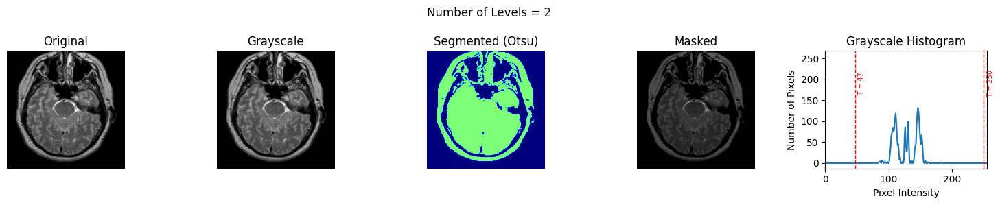


Processing at level k=3
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 332329755.52678
Iteration 100, Temperature 90.000, Best Evaluation 343156768.36422
SSIM: 0.7612852451303933
PSNR: 20.178671303015786
Saving results...
Displaying images...


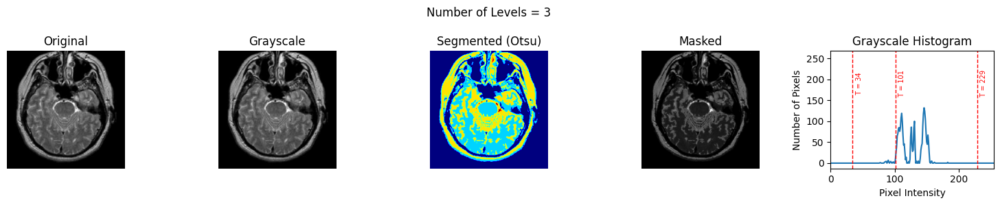


Processing at level k=4
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 328084014.52701
Iteration 100, Temperature 90.000, Best Evaluation 355550013.86739
SSIM: 0.8115346620170611
PSNR: 21.67296031955911
Saving results...
Displaying images...


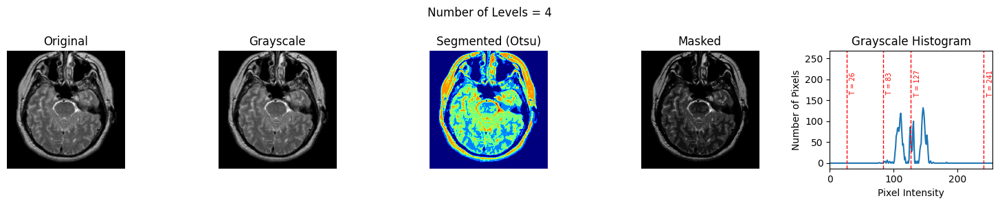


Processing at level k=5
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 356612419.66592
Iteration 100, Temperature 90.000, Best Evaluation 359318294.67841
SSIM: 0.8420410943804424
PSNR: 23.61538530450471
Saving results...
Displaying images...


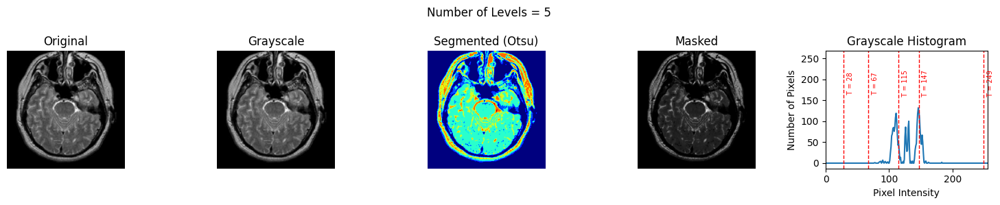



Image 2 of 5
Processing at level k=2
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 87889213.31505
Iteration 100, Temperature 90.000, Best Evaluation 307282336.78682
SSIM: 0.6414077431006534
PSNR: 19.22401518941474
Saving results...
Displaying images...


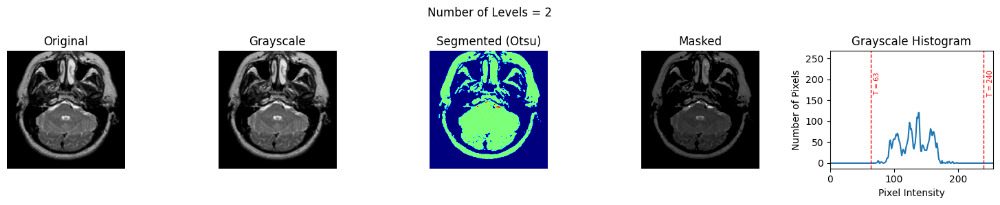


Processing at level k=3
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 202916867.62459
Iteration 100, Temperature 90.000, Best Evaluation 328241792.40313
SSIM: 0.7366518072453989
PSNR: 19.934396043992525
Saving results...
Displaying images...


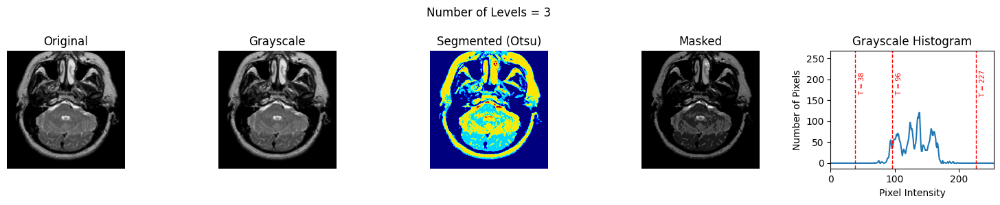


Processing at level k=4
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 249506269.37956
Iteration 100, Temperature 90.000, Best Evaluation 338065542.60367
SSIM: 0.7564290189598305
PSNR: 23.088215042582153
Saving results...
Displaying images...


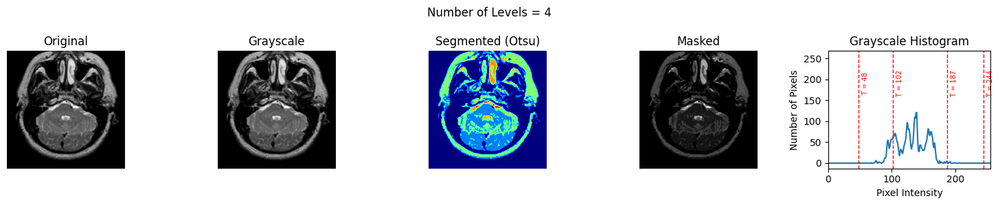


Processing at level k=5
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 321919645.47778
Iteration 100, Temperature 90.000, Best Evaluation 347138282.97745
SSIM: 0.8328727590934869
PSNR: 25.79354210399385
Saving results...
Displaying images...


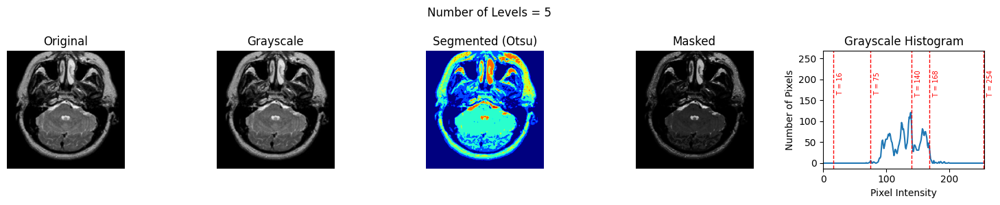



Image 3 of 5
Processing at level k=2
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 214322059.58391
Iteration 100, Temperature 90.000, Best Evaluation 217776364.91532
SSIM: 0.6130768137080629
PSNR: 19.128691860815742
Saving results...
Displaying images...


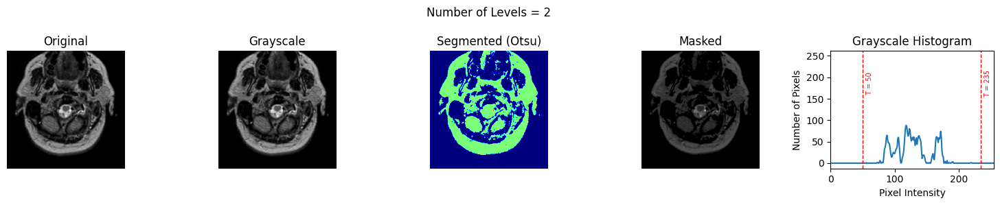


Processing at level k=3
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 234321444.41692
Iteration 100, Temperature 90.000, Best Evaluation 239122109.53444
SSIM: 0.7249288656448569
PSNR: 20.53693802878759
Saving results...
Displaying images...


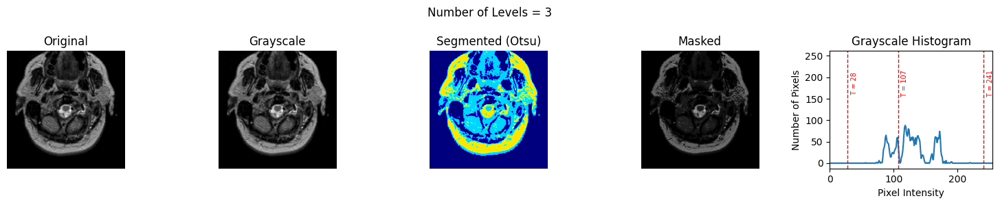


Processing at level k=4
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 232570950.74667
Iteration 100, Temperature 90.000, Best Evaluation 243929487.50306
SSIM: 0.7457117037036061
PSNR: 19.832000361062196
Saving results...
Displaying images...


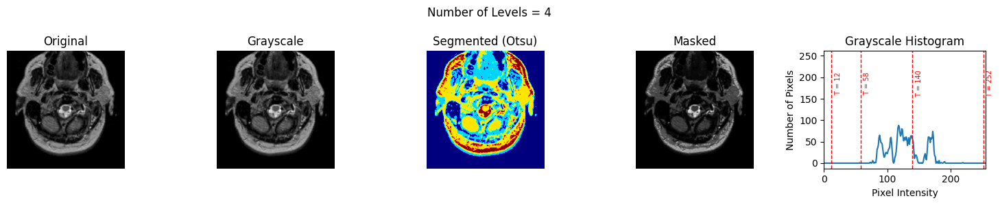


Processing at level k=5
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 198746124.54712
Iteration 100, Temperature 90.000, Best Evaluation 249818122.74438
SSIM: 0.7952769497601623
PSNR: 18.923811868954655
Saving results...
Displaying images...


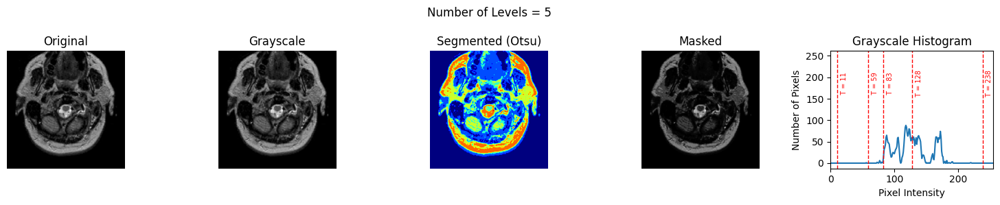



Image 4 of 5
Processing at level k=2
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 105382364.30442
Iteration 100, Temperature 90.000, Best Evaluation 254803704.83020
SSIM: 0.6424033644280457
PSNR: 19.60127905814496
Saving results...
Displaying images...


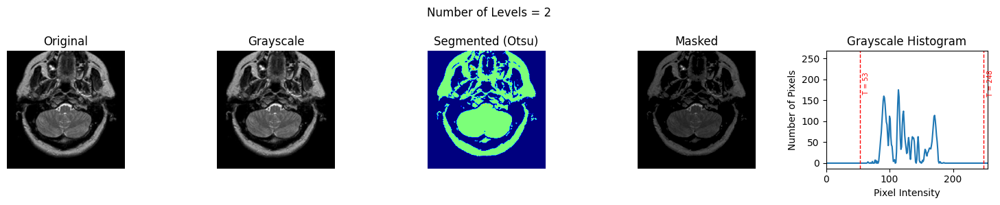


Processing at level k=3
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 125800525.76505
Iteration 100, Temperature 90.000, Best Evaluation 272250662.86256
SSIM: 0.7347061753012983
PSNR: 19.616241490109623
Saving results...
Displaying images...


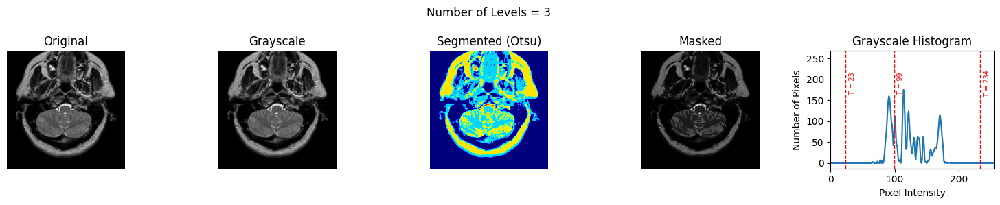


Processing at level k=4
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 262620431.12297
Iteration 100, Temperature 90.000, Best Evaluation 275137411.81782
SSIM: 0.7814608379206203
PSNR: 21.065098384070918
Saving results...
Displaying images...


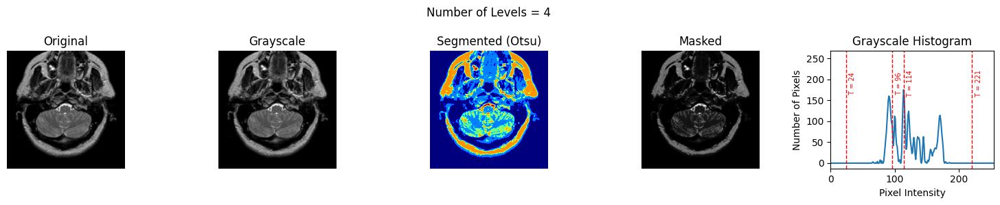


Processing at level k=5
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 272380130.18110
Iteration 100, Temperature 90.000, Best Evaluation 284224115.84735
SSIM: 0.8001896052768991
PSNR: 21.066233546494445
Saving results...
Displaying images...


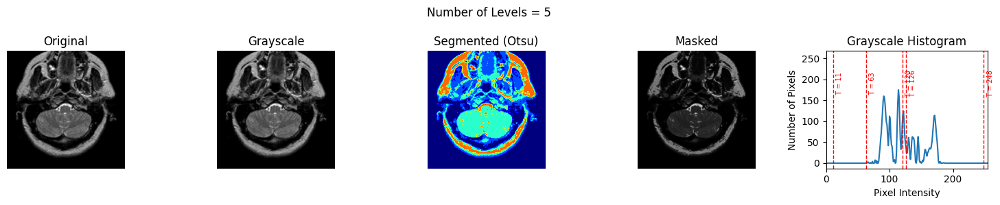



Image 5 of 5
Processing at level k=2
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 328942791.52783
Iteration 100, Temperature 90.000, Best Evaluation 386573996.83184
SSIM: 0.6155214887375343
PSNR: 18.721593047846355
Saving results...
Displaying images...


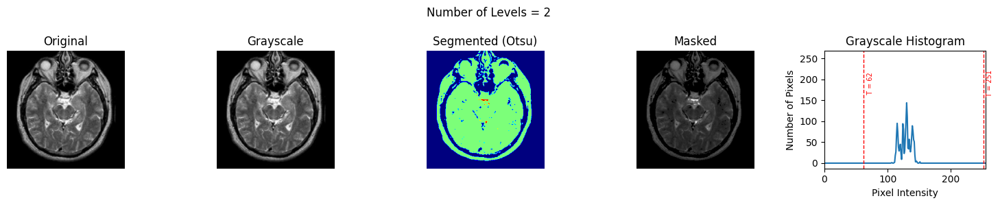


Processing at level k=3
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 389103719.65107
Iteration 100, Temperature 90.000, Best Evaluation 411036157.57679
SSIM: 0.7371995634378067
PSNR: 19.399890965023847
Saving results...
Displaying images...


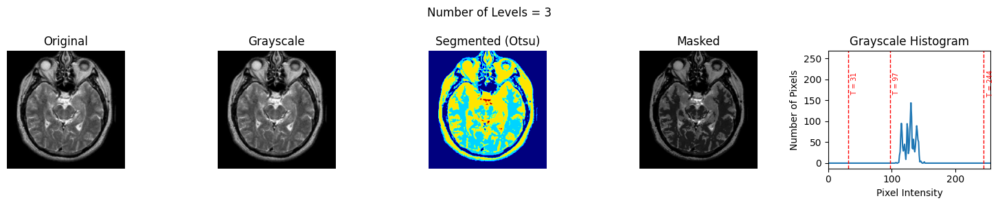


Processing at level k=4
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 369785900.99205
Iteration 100, Temperature 90.000, Best Evaluation 418235012.22640
SSIM: 0.8020072967177202
PSNR: 22.171820914138483
Saving results...
Displaying images...


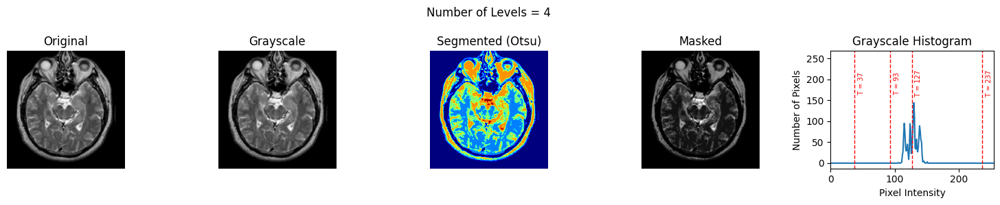


Processing at level k=5
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 399816457.57644
Iteration 100, Temperature 90.000, Best Evaluation 421538761.42632
SSIM: 0.7610253669636308
PSNR: 20.759488930058964
Saving results...
Displaying images...


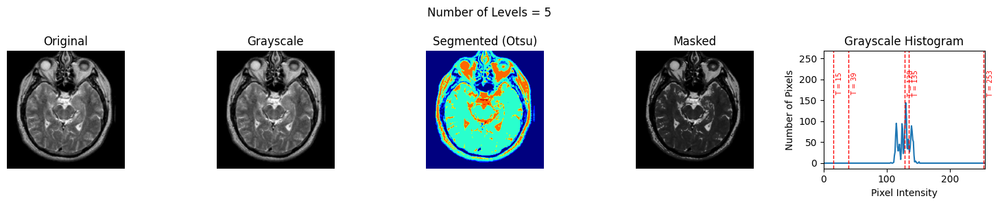


############################
##### PROGRAM FINISHED #####
############################


In [15]:
seed = 99
np.random.seed(seed)

original_images = []
# input_path = "./data/input/"
input_path = "/kaggle/input/cos791-a2-input"
output_path = "./data/output/"

# Parameters
objective = 'otsu'
algorithm = 'sa'
k = [2, 3, 4, 5]
bounds = [0, 255]
num_iterations = 1000
step_size = 5
initial_temp = 100

parameters = {
  'objective': objective,
  'algorithm': algorithm,
  'k': k,
  'bounds': bounds,
  'num_iterations': num_iterations,
  'step_size': step_size,
  'initial_temp': initial_temp
}

# Check for GPU
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
print(f"Using device: {device}\n")

if not os.path.exists(output_path):
    os.makedirs(output_path)

file_names = []
input_paths = []

for filename in os.listdir(input_path):
    file_names.append(filename)
    input_paths.append(os.path.join(input_path, filename))

for path in input_paths:
    image = cv2.imread(path)
    image = image.astype(np.uint8)
    original_images.append(image)

print("#"*27)
print("#"*5, "PROGRAM STARTED", "#"*5)
print("#"*27)

print("-"*22)
print("-"*5, "PARAMETERS", "-"*5)
print("-"*22)
print(f"-"*3 + "Objective: " + objective)
print(f"-"*3 + "Algorithm: " + algorithm)
print(f"-"*3 + "K: " + str(k))
print(f"-"*3 + "Bounds: " + str(bounds))
print(f"-"*3 + "Number of Iterations: " + str(num_iterations))
print(f"-"*3 + "Step Size: " + str(step_size))
print(f"-"*3 + "Initial Temperature: " + str(initial_temp))
print("-"*22)

run_program(original_images, file_names, parameters, output_path)

print("#"*28)
print("#"*5, "PROGRAM FINISHED", "#"*5)
print("#"*28)

#### OTSU - Variable Neighbourhood Search

Using device: cpu

###########################
##### PROGRAM STARTED #####
###########################
----------------------
----- PARAMETERS -----
----------------------
---Objective: otsu
---Algorithm: vns
---K: [2, 3, 4, 5]
---Bounds: [0, 255]
---Number of Iterations: 1000
---Step Size: 5
---Initial Temperature: 100
----------------------
Parameters initialised
Results will be saved to: ./data/output/OTSU/VNS/
Processing started...

Image 1 of 5
Processing at level k=2
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 318017543.53035
SSIM: 0.6610728793021597
PSNR: 16.24370612552813
Saving results...
Displaying images...


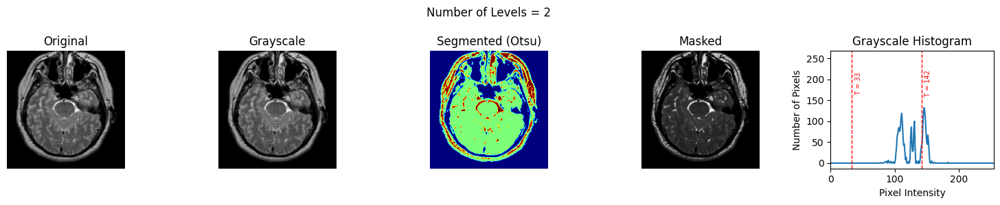


Processing at level k=3
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 337732805.60979
SSIM: 0.5294898666160572
PSNR: 18.579060108217867
Saving results...
Displaying images...


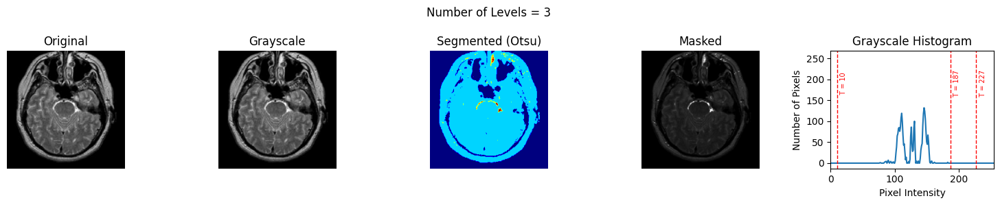


Processing at level k=4
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 341517806.10680
SSIM: 0.613626747147727
PSNR: 11.320324566989513
Saving results...
Displaying images...


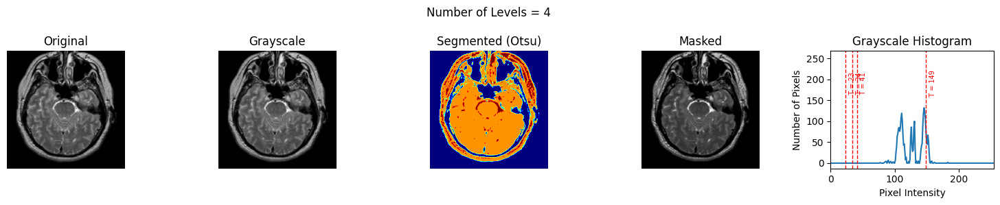


Processing at level k=5
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 332906716.71975
SSIM: 0.5571197585546093
PSNR: 10.642683287950817
Saving results...
Displaying images...


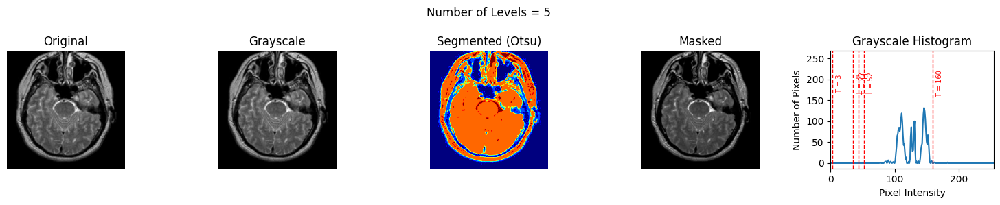



Image 2 of 5
Processing at level k=2
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 273474714.93492
SSIM: 0.4638604837350609
PSNR: 14.058123044428712
Saving results...
Displaying images...


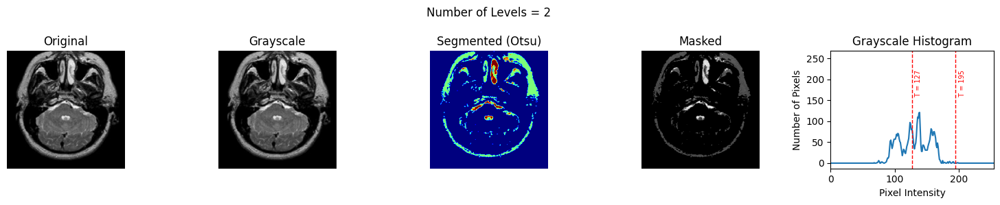


Processing at level k=3
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 191426139.27327
SSIM: 0.47627358499301947
PSNR: 14.046857182030234
Saving results...
Displaying images...


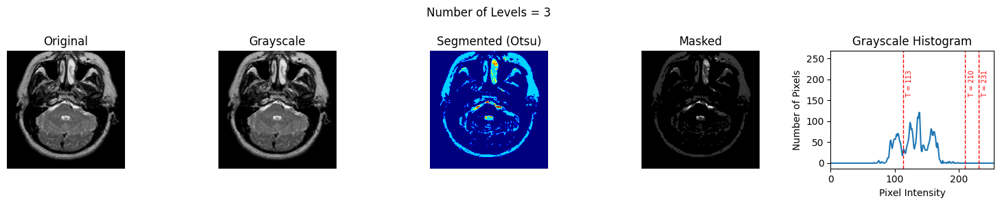


Processing at level k=4
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 318916614.81987
SSIM: 0.7047435904549901
PSNR: 19.754286932328238
Saving results...
Displaying images...


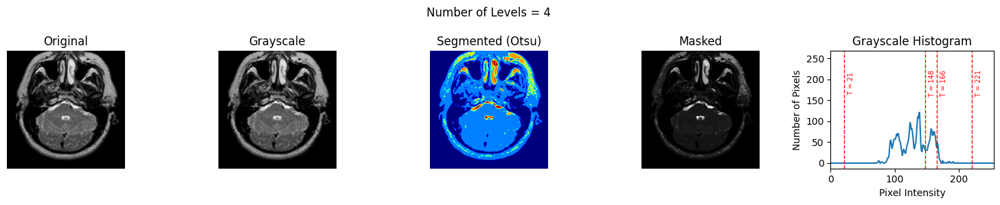


Processing at level k=5
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 274842168.38123
SSIM: 0.437821834827392
PSNR: 13.247483195252357
Saving results...
Displaying images...


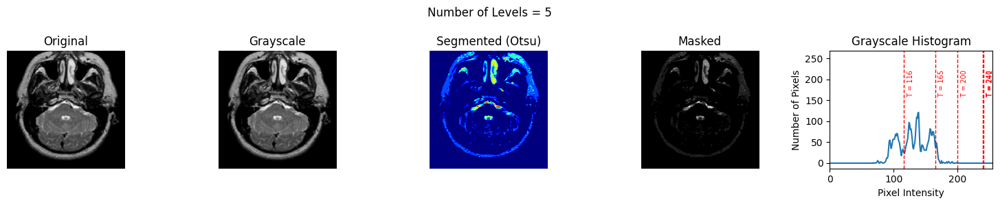



Image 3 of 5
Processing at level k=2
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 165567825.86619
SSIM: 0.5226062743992969
PSNR: 17.67966857631483
Saving results...
Displaying images...


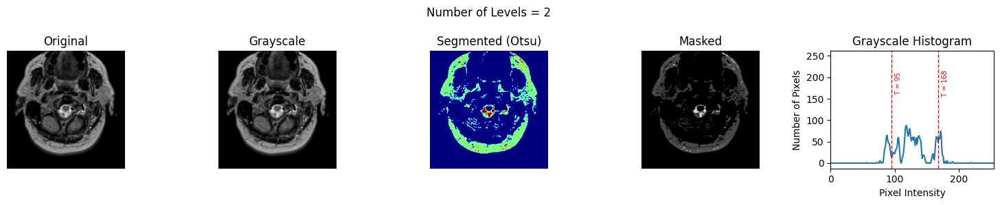


Processing at level k=3
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 215987289.51642
SSIM: 0.6454995515457468
PSNR: 20.077750634922012
Saving results...
Displaying images...


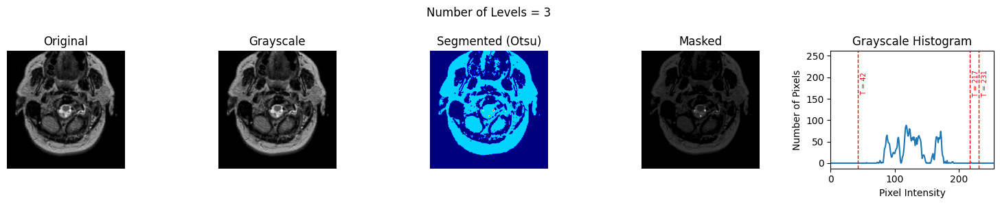


Processing at level k=4
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 174043995.75764
SSIM: 0.6117484116001298
PSNR: 11.087884370891402
Saving results...
Displaying images...


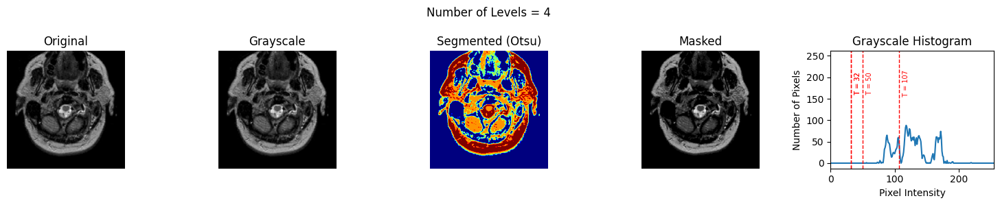


Processing at level k=5
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 240117213.34053
SSIM: 0.6349723565830617
PSNR: 13.750264566717119
Saving results...
Displaying images...


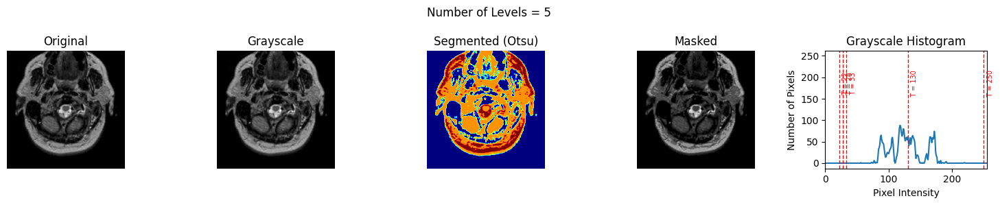



Image 4 of 5
Processing at level k=2
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 31215125.36402
SSIM: 0.3590153646180682
PSNR: 11.821667440810163
Saving results...
Displaying images...


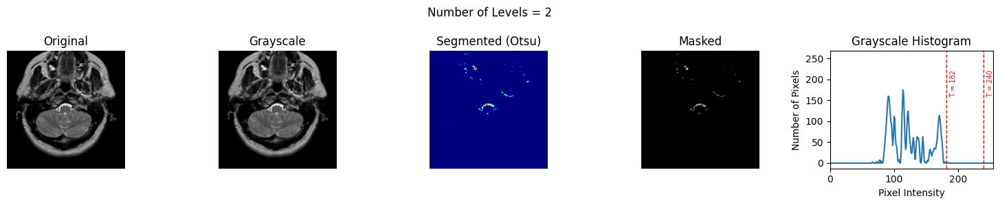


Processing at level k=3
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 117795854.99026
SSIM: 0.23854579623593436
PSNR: 11.118324723932936
Saving results...
Displaying images...


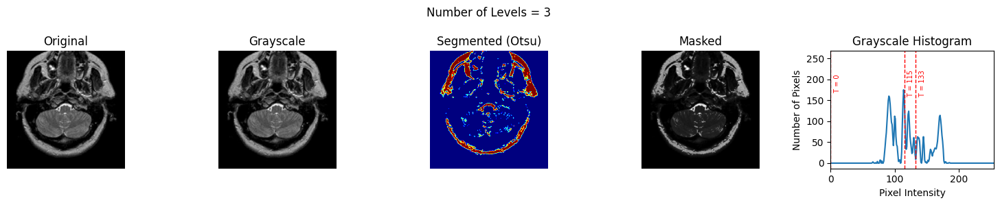


Processing at level k=4
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 272943084.87257
SSIM: 0.7106428048495173
PSNR: 20.645290172942772
Saving results...
Displaying images...


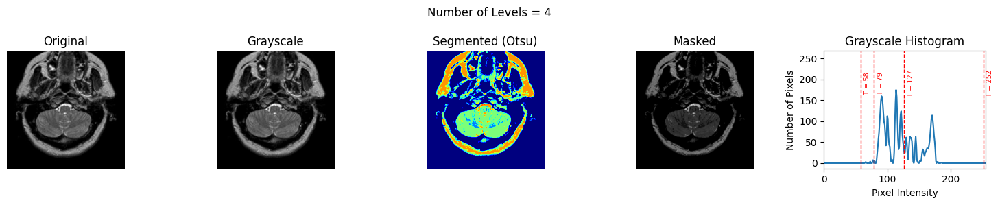


Processing at level k=5
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 272177488.95403
SSIM: 0.6487821087163588
PSNR: 20.364653006761458
Saving results...
Displaying images...


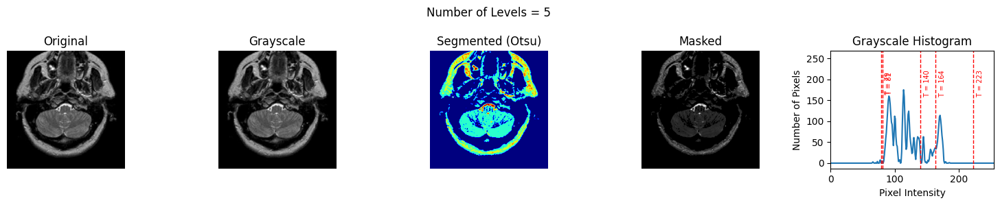



Image 5 of 5
Processing at level k=2
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 329662674.85464
SSIM: 0.4167593832079145
PSNR: 14.660209674203976
Saving results...
Displaying images...


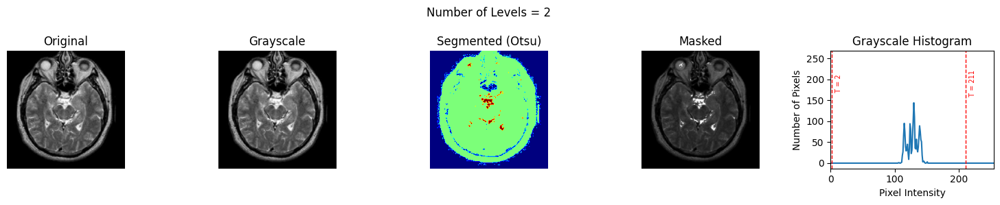


Processing at level k=3
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 378335642.84858
SSIM: 0.2918220276388598
PSNR: 12.656477146654378
Saving results...
Displaying images...


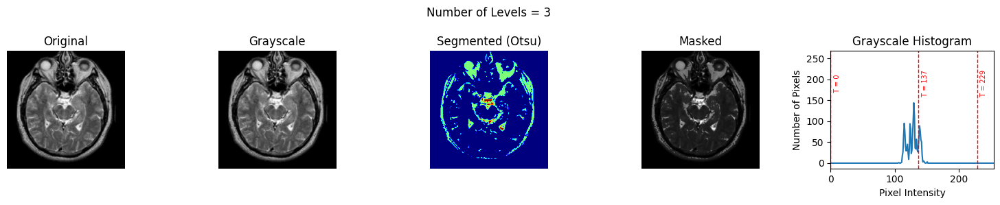


Processing at level k=4
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 378900210.29815
SSIM: 0.6867762682612538
PSNR: 12.84348821306959
Saving results...
Displaying images...


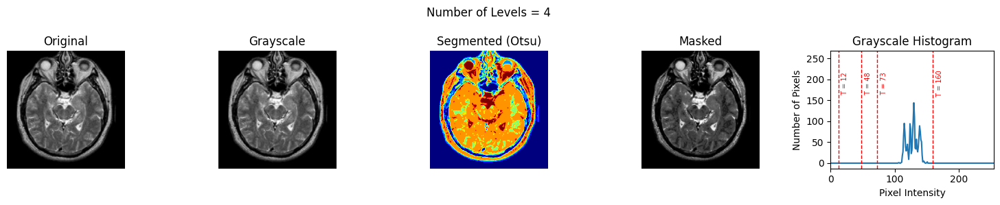


Processing at level k=5
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 414055241.57803
SSIM: 0.761171054448357
PSNR: 23.541525503991835
Saving results...
Displaying images...


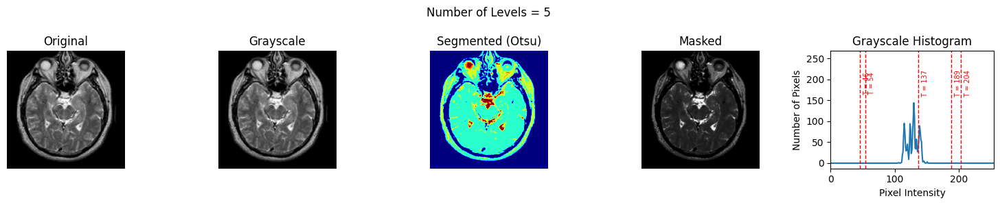


############################
##### PROGRAM FINISHED #####
############################


In [16]:
seed = 99
np.random.seed(seed)

original_images = []
# input_path = "./data/input/"
input_path = "/kaggle/input/cos791-a2-input"
output_path = "./data/output/"

# Parameters
objective = 'otsu'
algorithm = 'vns'
k = [2, 3, 4, 5]
bounds = [0, 255]
num_iterations = 1000
step_size = 5
initial_temp = 100

parameters = {
  'objective': objective,
  'algorithm': algorithm,
  'k': k,
  'bounds': bounds,
  'num_iterations': num_iterations,
  'step_size': step_size,
  'initial_temp': initial_temp
}

# Check for GPU
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
print(f"Using device: {device}\n")

if not os.path.exists(output_path):
    os.makedirs(output_path)

file_names = []
input_paths = []

for filename in os.listdir(input_path):
    file_names.append(filename)
    input_paths.append(os.path.join(input_path, filename))

for path in input_paths:
    image = cv2.imread(path)
    image = image.astype(np.uint8)
    original_images.append(image)

print("#"*27)
print("#"*5, "PROGRAM STARTED", "#"*5)
print("#"*27)

print("-"*22)
print("-"*5, "PARAMETERS", "-"*5)
print("-"*22)
print(f"-"*3 + "Objective: " + objective)
print(f"-"*3 + "Algorithm: " + algorithm)
print(f"-"*3 + "K: " + str(k))
print(f"-"*3 + "Bounds: " + str(bounds))
print(f"-"*3 + "Number of Iterations: " + str(num_iterations))
print(f"-"*3 + "Step Size: " + str(step_size))
print(f"-"*3 + "Initial Temperature: " + str(initial_temp))
print("-"*22)

run_program(original_images, file_names, parameters, output_path)

print("#"*28)
print("#"*5, "PROGRAM FINISHED", "#"*5)
print("#"*28)

#### KAPUR - Simulated Annealing

Using device: cpu

###########################
##### PROGRAM STARTED #####
###########################
----------------------
----- PARAMETERS -----
----------------------
---Objective: kapur
---Algorithm: sa
---K: [2, 3, 4, 5]
---Bounds: [0, 255]
---Number of Iterations: 1000
---Step Size: 5
---Initial Temperature: 100
----------------------
Parameters initialised
Results will be saved to: ./data/output/KAPUR/SA/
Processing started...

Image 1 of 5
Processing at level k=2
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 4.59712
Iteration 100, Temperature 90.000, Best Evaluation 5.04044
SSIM: 0.4863929851543418
PSNR: 15.716925384625302
Saving results...
Displaying images...


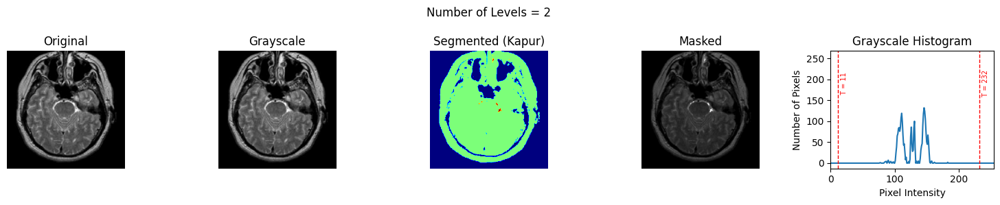


Processing at level k=3
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 7.29601
Iteration 100, Temperature 90.000, Best Evaluation 8.79890
SSIM: 0.6963624912003169
PSNR: 18.546476338844453
Saving results...
Displaying images...


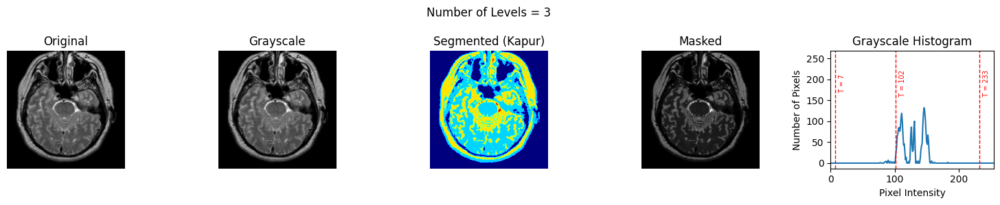


Processing at level k=4
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 9.63502
Iteration 100, Temperature 90.000, Best Evaluation 12.32582
SSIM: 0.7217056449530662
PSNR: 19.067292456513
Saving results...
Displaying images...


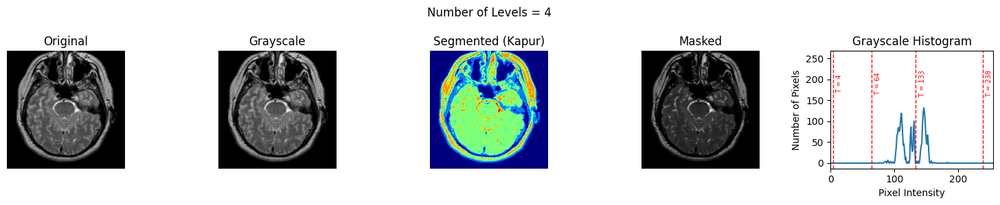


Processing at level k=5
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 13.68072
Iteration 100, Temperature 90.000, Best Evaluation 15.23031
SSIM: 0.4826375713156156
PSNR: 15.862370781491268
Saving results...
Displaying images...


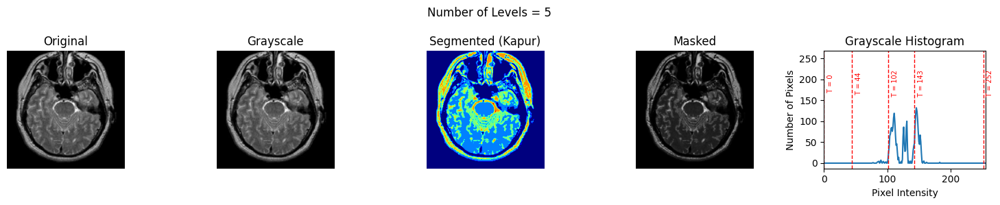



Image 2 of 5
Processing at level k=2
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 4.98845
Iteration 100, Temperature 90.000, Best Evaluation 5.19103
SSIM: 0.4482551507038473
PSNR: 14.369365814296096
Saving results...
Displaying images...


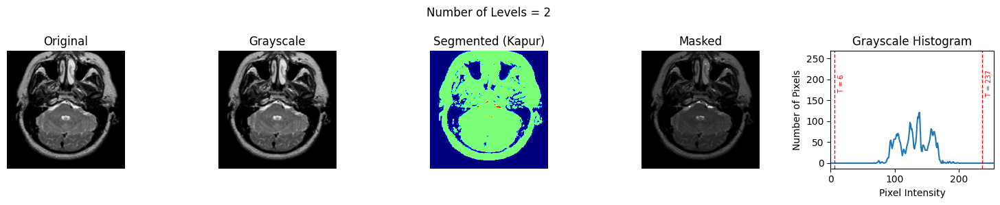


Processing at level k=3
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 7.28978
Iteration 100, Temperature 90.000, Best Evaluation 9.12878
SSIM: 0.5197123753165762
PSNR: 17.218301584119168
Saving results...
Displaying images...


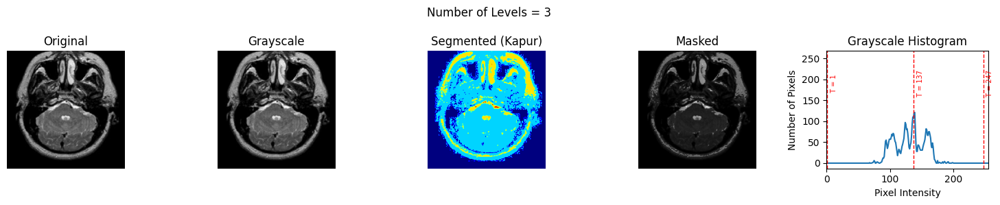


Processing at level k=4
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 10.72350
Iteration 100, Temperature 90.000, Best Evaluation 12.60825
SSIM: 0.3323247507582151
PSNR: 14.715871680956816
Saving results...
Displaying images...


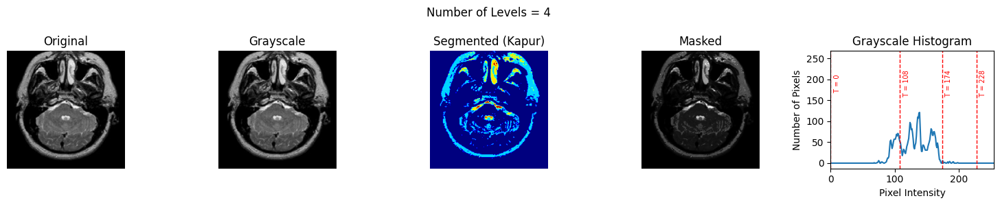


Processing at level k=5
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 14.93706
Iteration 100, Temperature 90.000, Best Evaluation 15.57436
SSIM: 0.8274708692780125
PSNR: 24.728203226840183
Saving results...
Displaying images...


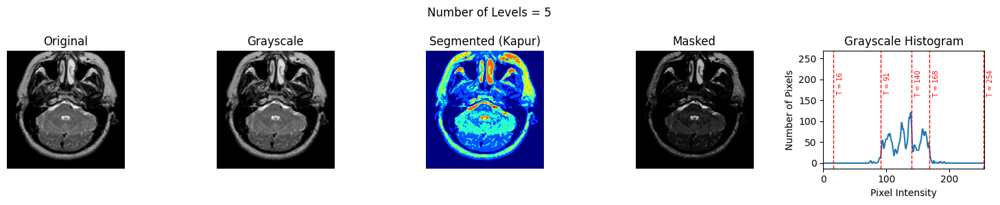



Image 3 of 5
Processing at level k=2
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 4.45710
Iteration 100, Temperature 90.000, Best Evaluation 5.05535
SSIM: 0.40515537149197234
PSNR: 12.973231666598279
Saving results...
Displaying images...


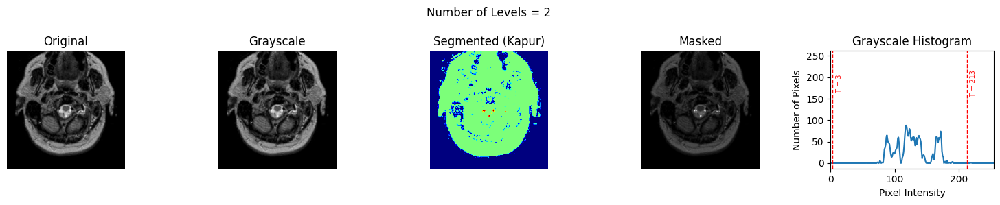


Processing at level k=3
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 8.08116
Iteration 100, Temperature 90.000, Best Evaluation 8.84094
SSIM: 0.6052257705154643
PSNR: 16.215385805606243
Saving results...
Displaying images...


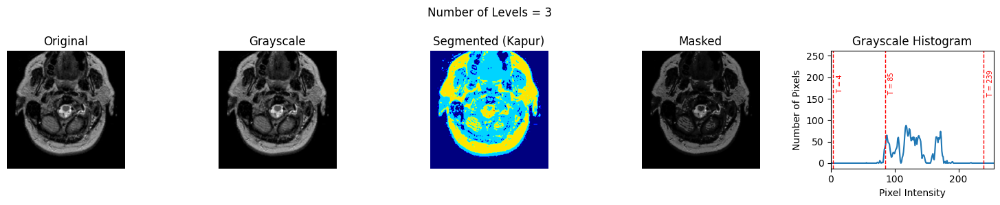


Processing at level k=4
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 10.22821
Iteration 100, Temperature 90.000, Best Evaluation 12.18117
SSIM: 0.6581185456689689
PSNR: 20.045072906155564
Saving results...
Displaying images...


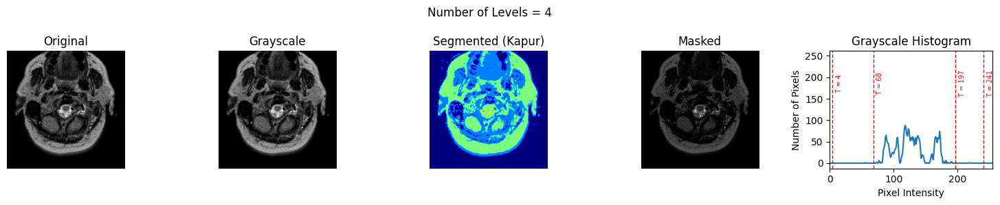


Processing at level k=5
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 13.18015
Iteration 100, Temperature 90.000, Best Evaluation 15.71363
SSIM: 0.7651274646893365
PSNR: 23.743497018927503
Saving results...
Displaying images...


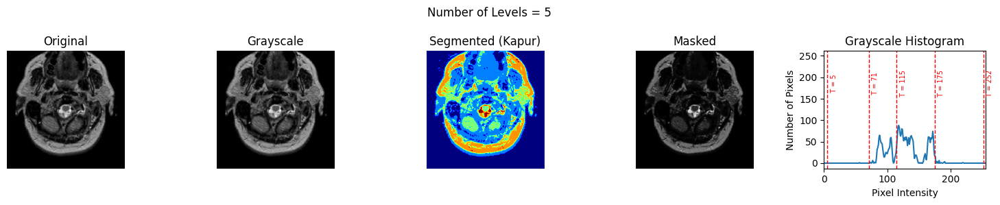



Image 4 of 5
Processing at level k=2
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 3.95415
Iteration 100, Temperature 90.000, Best Evaluation 5.10686
SSIM: 0.45559366248383787
PSNR: 14.152630396899713
Saving results...
Displaying images...


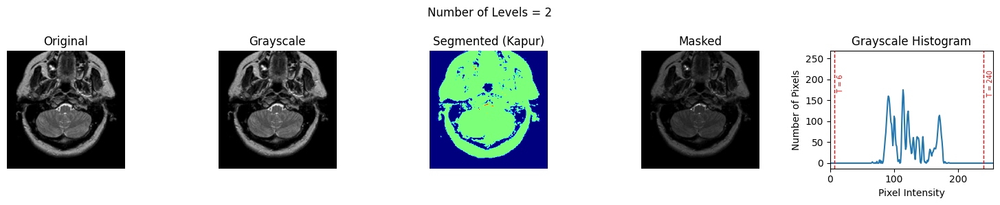


Processing at level k=3
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 8.38416
Iteration 100, Temperature 90.000, Best Evaluation 8.88085
SSIM: 0.6613735107622843
PSNR: 19.934621411466985
Saving results...
Displaying images...


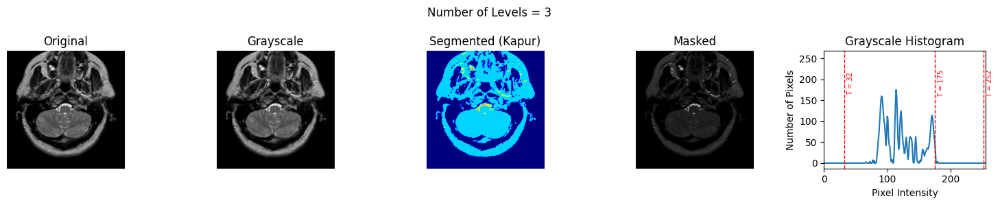


Processing at level k=4
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 10.96331
Iteration 100, Temperature 90.000, Best Evaluation 12.44745
SSIM: 0.7103919279057924
PSNR: 20.05784892934319
Saving results...
Displaying images...


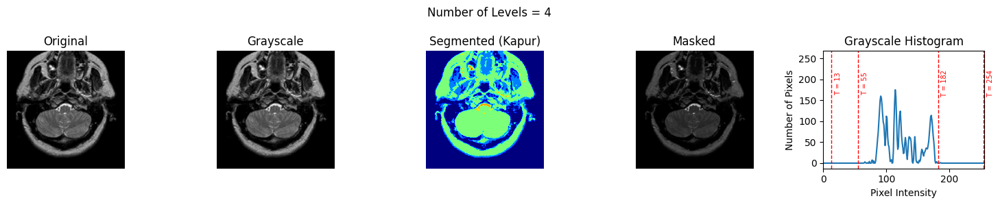


Processing at level k=5
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 12.11875
Iteration 100, Temperature 90.000, Best Evaluation 15.22832
SSIM: 0.7614825572125984
PSNR: 20.87660125183205
Saving results...
Displaying images...


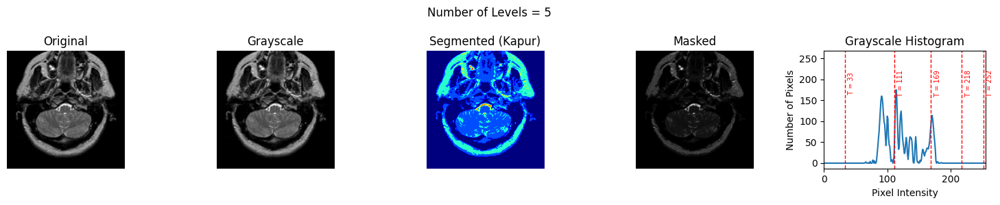



Image 5 of 5
Processing at level k=2
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 4.67003
Iteration 100, Temperature 90.000, Best Evaluation 5.16279
SSIM: 0.4651104036111514
PSNR: 15.410758894302969
Saving results...
Displaying images...


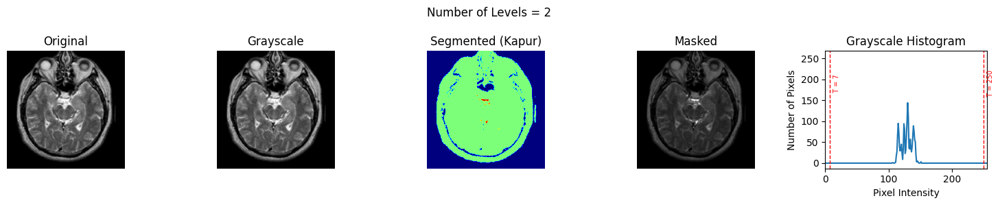


Processing at level k=3
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 8.02652
Iteration 100, Temperature 90.000, Best Evaluation 9.13455
SSIM: 0.24301675487166477
PSNR: 12.516065210351709
Saving results...
Displaying images...


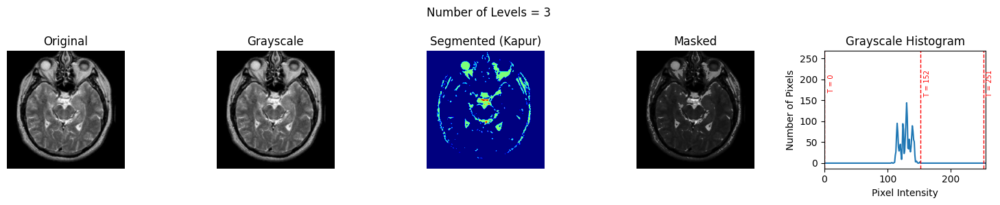


Processing at level k=4
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 11.47579
Iteration 100, Temperature 90.000, Best Evaluation 12.57732
SSIM: 0.6288030834993752
PSNR: 18.9188184485249
Saving results...
Displaying images...


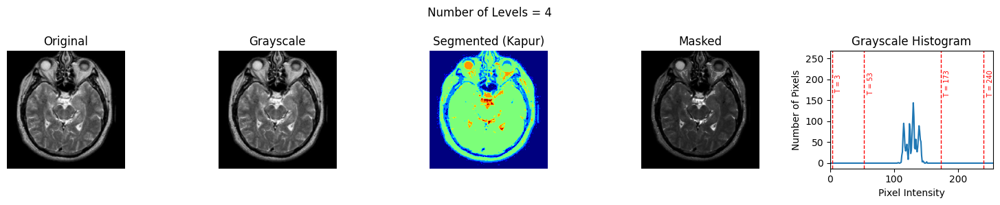


Processing at level k=5
Performing Simulated Annealing...
Iteration 0, Temperature 100.000, Best Evaluation 13.12102
Iteration 100, Temperature 90.000, Best Evaluation 15.66544
SSIM: 0.8203267874432033
PSNR: 20.698769368440683
Saving results...
Displaying images...


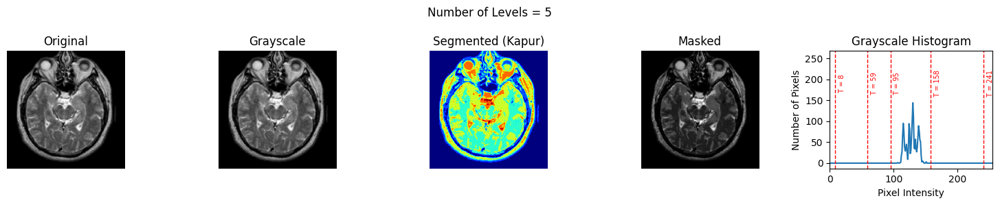


############################
##### PROGRAM FINISHED #####
############################


In [17]:
seed = 99
np.random.seed(seed)

original_images = []
# input_path = "./data/input/"
input_path = "/kaggle/input/cos791-a2-input"
output_path = "./data/output/"

# Parameters
objective = 'kapur'
algorithm = 'sa'
k = [2, 3, 4, 5]
bounds = [0, 255]
num_iterations = 1000
step_size = 5
initial_temp = 100

parameters = {
  'objective': objective,
  'algorithm': algorithm,
  'k': k,
  'bounds': bounds,
  'num_iterations': num_iterations,
  'step_size': step_size,
  'initial_temp': initial_temp
}

# Check for GPU
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
print(f"Using device: {device}\n")

if not os.path.exists(output_path):
    os.makedirs(output_path)

file_names = []
input_paths = []

for filename in os.listdir(input_path):
    file_names.append(filename)
    input_paths.append(os.path.join(input_path, filename))

for path in input_paths:
    image = cv2.imread(path)
    image = image.astype(np.uint8)
    original_images.append(image)

print("#"*27)
print("#"*5, "PROGRAM STARTED", "#"*5)
print("#"*27)

print("-"*22)
print("-"*5, "PARAMETERS", "-"*5)
print("-"*22)
print(f"-"*3 + "Objective: " + objective)
print(f"-"*3 + "Algorithm: " + algorithm)
print(f"-"*3 + "K: " + str(k))
print(f"-"*3 + "Bounds: " + str(bounds))
print(f"-"*3 + "Number of Iterations: " + str(num_iterations))
print(f"-"*3 + "Step Size: " + str(step_size))
print(f"-"*3 + "Initial Temperature: " + str(initial_temp))
print("-"*22)

run_program(original_images, file_names, parameters, output_path)

print("#"*28)
print("#"*5, "PROGRAM FINISHED", "#"*5)
print("#"*28)

#### KAPUR - Variable Neighbourhood Search

Using device: cpu

###########################
##### PROGRAM STARTED #####
###########################
----------------------
----- PARAMETERS -----
----------------------
---Objective: kapur
---Algorithm: vns
---K: [2, 3, 4, 5]
---Bounds: [0, 255]
---Number of Iterations: 1000
---Step Size: 5
---Initial Temperature: 100
----------------------
Parameters initialised
Results will be saved to: ./data/output/KAPUR/VNS/
Processing started...

Image 1 of 5
Processing at level k=2
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 4.59712
SSIM: 0.6588654530869921
PSNR: 15.649333571370295
Saving results...
Displaying images...


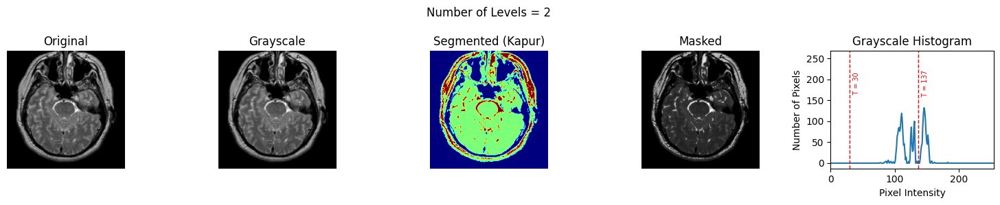


Processing at level k=3
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 8.05857
SSIM: 0.726202895732994
PSNR: 17.985636866969664
Saving results...
Displaying images...


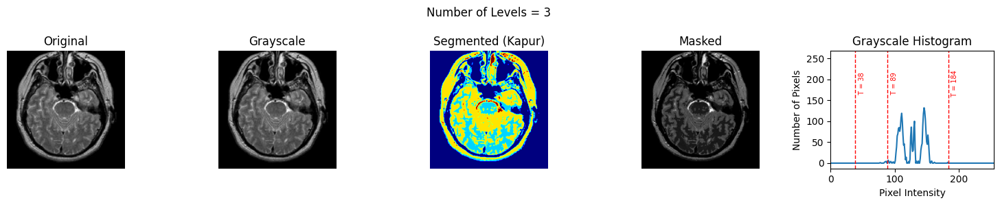


Processing at level k=4
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 11.85951
SSIM: 0.643872628793373
PSNR: 11.799080673661697
Saving results...
Displaying images...


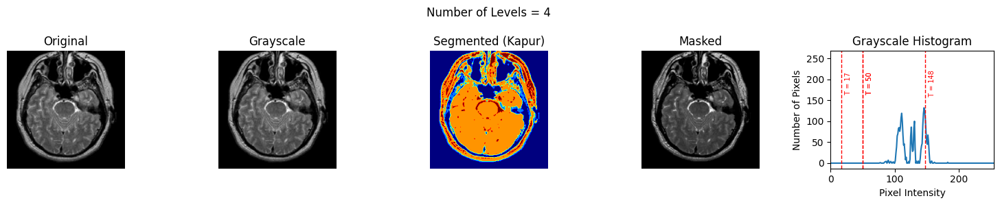


Processing at level k=5
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 12.97504
SSIM: 0.6181634735244935
PSNR: 14.73762125178321
Saving results...
Displaying images...


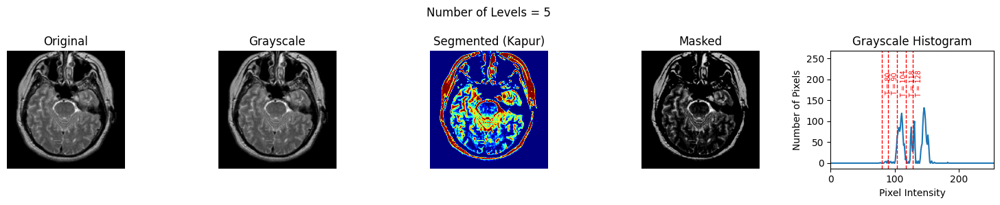



Image 2 of 5
Processing at level k=2
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 4.88765
SSIM: 0.5838128881447916
PSNR: 12.627420764508768
Saving results...
Displaying images...


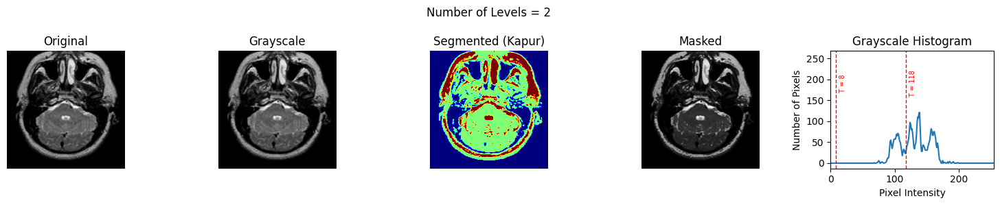


Processing at level k=3
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 8.15788
SSIM: 0.7517656099914019
PSNR: 18.55500677860597
Saving results...
Displaying images...


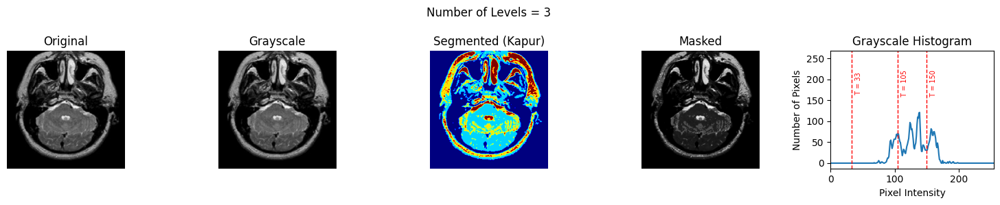


Processing at level k=4
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 12.15752
SSIM: 0.7786188911111613
PSNR: 24.448656531514466
Saving results...
Displaying images...


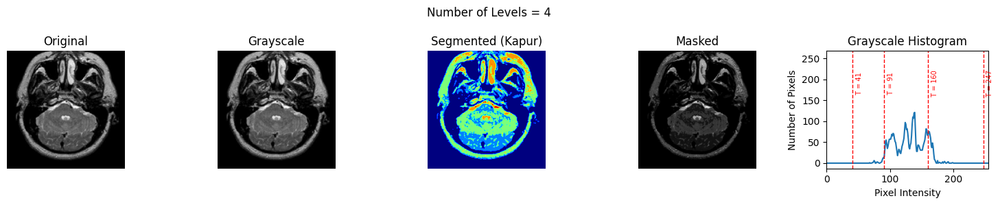


Processing at level k=5
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 13.84642
SSIM: 0.7253416134988888
PSNR: 21.955978910623006
Saving results...
Displaying images...


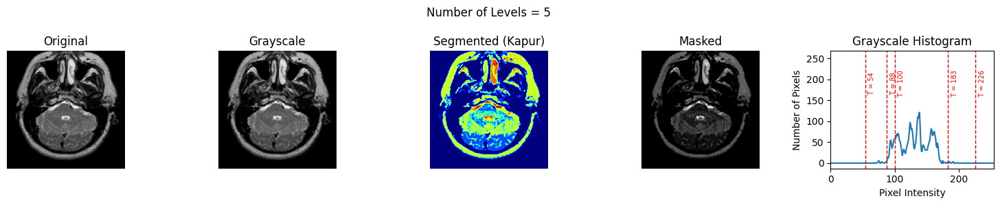



Image 3 of 5
Processing at level k=2
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 4.86621
SSIM: 0.628975907428296
PSNR: 13.549362810176898
Saving results...
Displaying images...


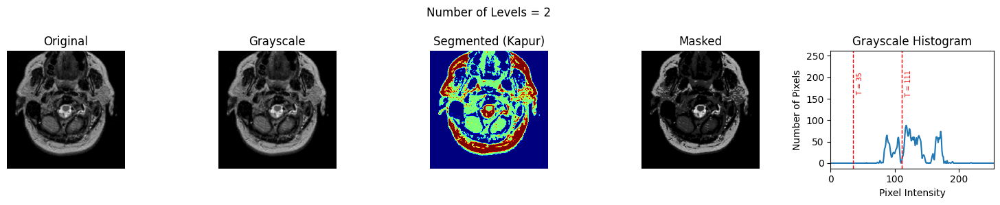


Processing at level k=3
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 6.91954
SSIM: 0.4696305900940881
PSNR: 15.985593421581088
Saving results...
Displaying images...


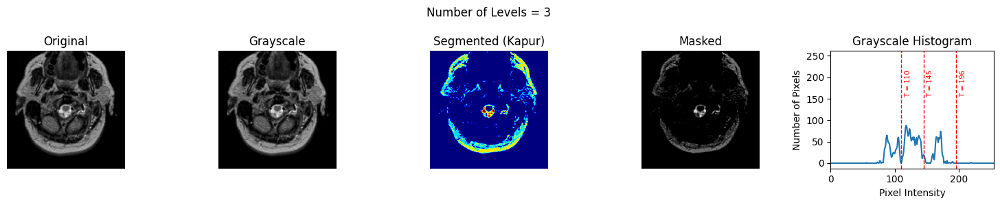


Processing at level k=4
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 10.01913
SSIM: 0.5988299221080353
PSNR: 19.73999604943449
Saving results...
Displaying images...


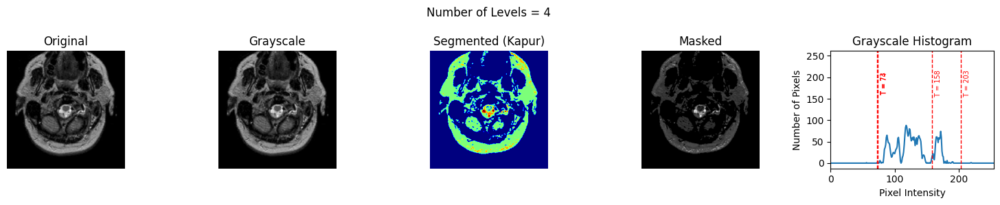


Processing at level k=5
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 13.29416
SSIM: 0.6422786131159469
PSNR: 13.972591686832555
Saving results...
Displaying images...


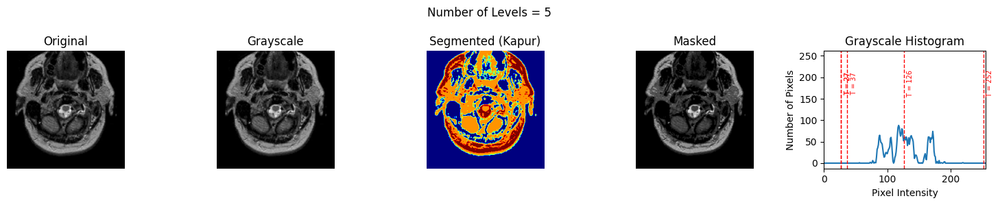



Image 4 of 5
Processing at level k=2
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 3.91493
SSIM: 0.47702804292137935
PSNR: 14.927301564668888
Saving results...
Displaying images...


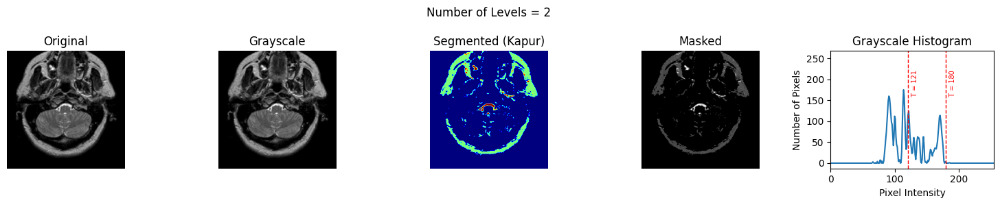


Processing at level k=3
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 8.33430
SSIM: 0.47970870111787794
PSNR: 15.008196541593069
Saving results...
Displaying images...


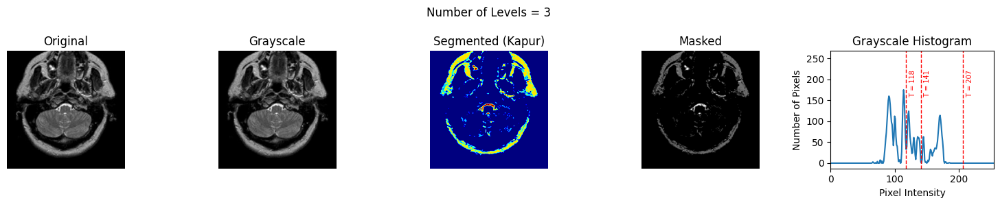


Processing at level k=4
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 10.80004
SSIM: 0.7171409538321386
PSNR: 16.178529250553456
Saving results...
Displaying images...


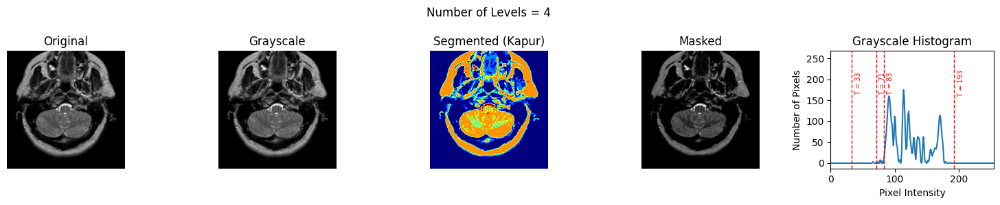


Processing at level k=5
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 11.97473
SSIM: 0.7077359155045484
PSNR: 21.7647004651992
Saving results...
Displaying images...


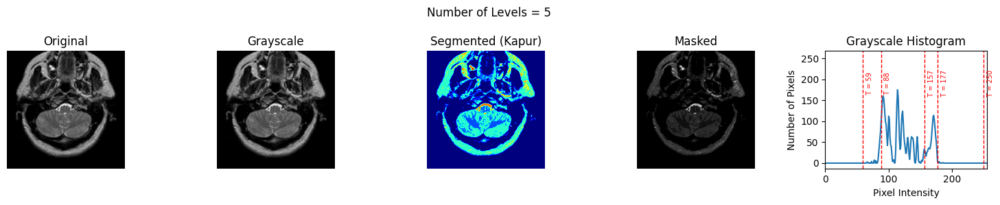



Image 5 of 5
Processing at level k=2
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 4.49968
SSIM: 0.5497100047352481
PSNR: 8.980790512682118
Saving results...
Displaying images...


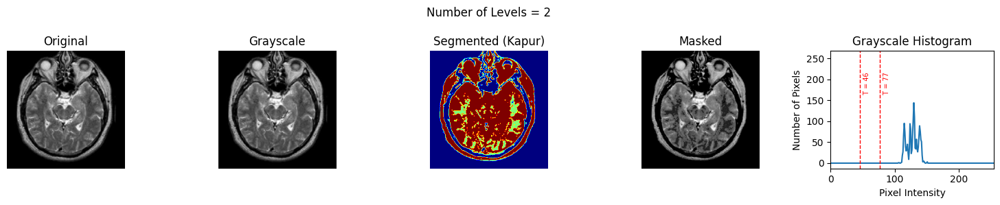


Processing at level k=3
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 8.19296
SSIM: 0.5206866091878819
PSNR: 13.833722486919807
Saving results...
Displaying images...


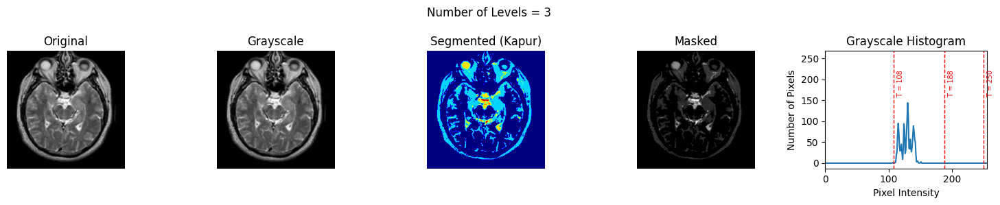


Processing at level k=4
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 10.51041
SSIM: 0.761487777503448
PSNR: 21.951859374747333
Saving results...
Displaying images...


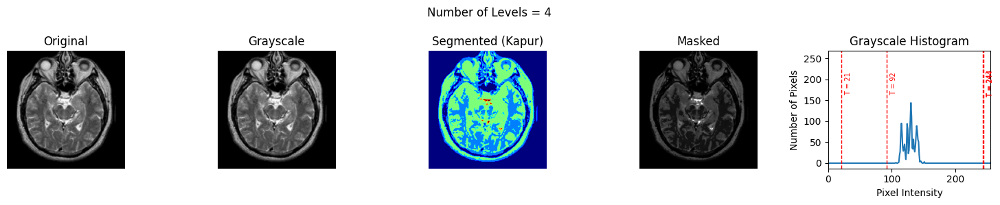


Processing at level k=5
Performing Variable Neighbourhood Search...
Iteration 0, Best Evaluation 14.58300
SSIM: 0.810677847548798
PSNR: 23.53285274107622
Saving results...
Displaying images...


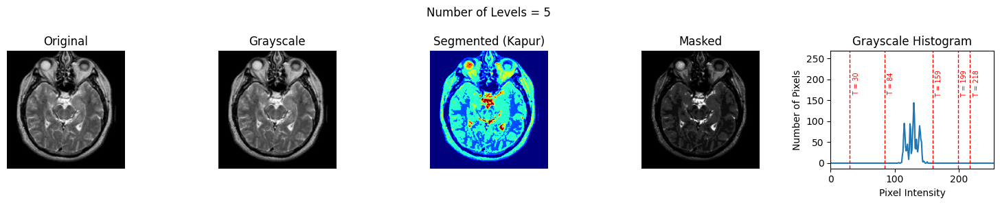


############################
##### PROGRAM FINISHED #####
############################


In [18]:
seed = 99
np.random.seed(seed)

original_images = []
# input_path = "./data/input/"
input_path = "/kaggle/input/cos791-a2-input"
output_path = "./data/output/"

# Parameters
objective = 'kapur'
algorithm = 'vns'
k = [2, 3, 4, 5]
bounds = [0, 255]
num_iterations = 1000
step_size = 5
initial_temp = 100

parameters = {
  'objective': objective,
  'algorithm': algorithm,
  'k': k,
  'bounds': bounds,
  'num_iterations': num_iterations,
  'step_size': step_size,
  'initial_temp': initial_temp
}

# Check for GPU
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
print(f"Using device: {device}\n")

if not os.path.exists(output_path):
    os.makedirs(output_path)

file_names = []
input_paths = []

for filename in os.listdir(input_path):
    file_names.append(filename)
    input_paths.append(os.path.join(input_path, filename))

for path in input_paths:
    image = cv2.imread(path)
    image = image.astype(np.uint8)
    original_images.append(image)

print("#"*27)
print("#"*5, "PROGRAM STARTED", "#"*5)
print("#"*27)

print("-"*22)
print("-"*5, "PARAMETERS", "-"*5)
print("-"*22)
print(f"-"*3 + "Objective: " + objective)
print(f"-"*3 + "Algorithm: " + algorithm)
print(f"-"*3 + "K: " + str(k))
print(f"-"*3 + "Bounds: " + str(bounds))
print(f"-"*3 + "Number of Iterations: " + str(num_iterations))
print(f"-"*3 + "Step Size: " + str(step_size))
print(f"-"*3 + "Initial Temperature: " + str(initial_temp))
print("-"*22)

run_program(original_images, file_names, parameters, output_path)

print("#"*28)
print("#"*5, "PROGRAM FINISHED", "#"*5)
print("#"*28)